# Palustrine thresholds <img align="right" src="../Supplementary_data/dea_logo.jpg">

* **Compatability:** Notebook currently compatible with the `NCI` environment
* **Products used:** 
[fc_percentile_albers_annual](https://explorer.sandbox.dea.ga.gov.au/fc_percentile_albers_annual)

## Description

LCCS needs a wet vegetation layer. It's OK if we miss some stuff, but it'd be nice to include as much as we can. We also don't want to include much extra stuff at all: we really only want wet vegetation. Can we identify palustrine wetlands (and not too much excess) using a threshold?

## Getting started

### Load packages
Import Python packages that are used for the analysis.

In [1]:
%%bash
pip install rioxarray

Defaulting to user installation because normal site-packages is not writeable


Unload all python modules, if you experience any issues.


In [2]:
%matplotlib inline

import functools
from multiprocessing.pool import Pool
import multiprocessing
import os
import sys
import cmocean
import datacube
from datacube.storage.masking import make_mask
import datacube.utils.cog
import datacube.utils.geometry
import geopandas as gpd
import ipyleaflet
from IPython.display import display
import ipywidgets as widgets
import matplotlib.colors
import matplotlib.patches
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import odc.ui
from odc.ui import with_ui_cbk
import rasterio.features
import rasterio.mask
import rioxarray
import scipy.stats
import seaborn
from shapely.geometry import shape, point
from shapely.validation import explain_validity
import skimage.color as colour
import skimage.io
import sklearn.decomposition
import sklearn.metrics
import sklearn.pipeline
import sklearn.preprocessing
from tqdm.notebook import tqdm
import xarray

sys.path.append("../Scripts")
from dea_plotting import rgb
from dea_dask import create_local_dask_cluster

/g/data/v10/public/modules/dea/20200819/lib/python3.6/site-packages/datacube/storage/masking.py:4: DeprecationWarning: datacube.storage.masking has moved to datacube.utils.masking
  category=DeprecationWarning)


### Set up Dask

This will let us lazily load tiles.

In [3]:
create_local_dask_cluster()

Client Scheduler: tcp://127.0.0.1:35369 Dashboard: /proxy/8787/status,Cluster Workers: 1 Cores: 8 Memory: 30.67 GB


### Connect to the datacube

Connect to the datacube so we can access DEA data.
The `app` parameter is a unique name for the analysis which is based on the notebook file name.

In [4]:
dc = datacube.Datacube(app="palustrine-thresholds")

### Load wetland shapes

The wetlands shapefile contains all wetlands in QLD.

In [5]:
wetlands = gpd.read_file(
    "QSC_Extracted_Data_20200820_104013993000-3580/Wetland_areas.shp"
)

In [6]:
len(wetlands)

534519

In [7]:
wetlands = wetlands.to_crs('EPSG:3577')

In [8]:
wetlands = wetlands[wetlands.WETCLASS_.notnull()]

We only have TCG for 25 tiles, so load those tiles:

In [9]:
tiles = gpd.read_file("QLDTestTiles.shp")

Then strip down the wetlands to only include shapes we have data for.

In [10]:
# buffer(0) attempts to correct invalid geometries.
sampled_wetlands = wetlands.to_crs('EPSG:3577').buffer(0).geometry.intersection(tiles.unary_union)

In [11]:
wetlands = wetlands[~sampled_wetlands.is_empty].reset_index()

In [12]:
len(wetlands)

94379

### Load data functions

These functions access TCW, TCG, wetland, MrVBF, and Koppen data on a per-tile basis.

In [13]:
def get_tcw(tile_label):
    try:
        tif_path_base = "/g/data/r78/datacube_stats/TCW_stats/demo_tiles/output_qld_wetness/LS_TCW_PC_{}_1986_2020_summary.tif"
        tif_path = tif_path_base.format(tile_label.replace(",", "_"))
        da = xarray.open_rasterio(tif_path, chunks={'band': 1, 'x': 1024, 'y': 1024})
    except:
        tif_path_base = "/g/data/r78/datacube_stats/TCW_stats/demo_tiles/gabrielle_workspace/output/LS_TCW_PC_{}_1986_2020_summary.tif"
        tif_path = tif_path_base.format(tile_label.replace(",", "_"))
        da = xarray.open_rasterio(tif_path, chunks={'band': 1, 'x': 1024, 'y': 1024})
        
    return da


def get_tcg(tile_label):
    try:
        tif_path_base = "/g/data/r78/datacube_stats/TCW_stats/demo_tiles/output_qld_greenness/LS_TCG_PC_{}_1986_2020_summary.tif"
        tif_path = tif_path_base.format(tile_label.replace(",", "_"))
        da = xarray.open_rasterio(tif_path, chunks={'band': 1, 'x': 1024, 'y': 1024})
    except:
        tif_path_base = "/g/data/r78/datacube_stats/TCW_stats/demo_tiles/gabrielle_workspace/output/LS_TCG_PC_{}_1986_2020_summary.tif"
        tif_path = tif_path_base.format(tile_label.replace(",", "_"))
        da = xarray.open_rasterio(tif_path, chunks={'band': 1, 'x': 1024, 'y': 1024})
    return da


def get_mrvbf(tile_label):
    mrvbf_path_base = (
        mrvbf_base_path
    ) = "/g/data/u46/wofs/confidence_albers/MrVBF/tiles/mrvbf_{}.nc"
    mrvbf_path = mrvbf_path_base.format(tile_label.replace(",", "_"))
    da = xarray.open_dataset(mrvbf_path, chunks={'time': 1, 'x': 1024, 'y': 1024}).band1
    da.attrs['crs'] = 'EPSG:3577'
    return da


def get_koppen_tile(da):
    koppen = rasterio.open(
        "/g/data/r78/ma6611/Beck_KG_V1_present_0p0083.tif"
    )  # 1km resolution
    dest = np.zeros(da.shape)
    src_transform = koppen.transform
    koppen_tile = rasterio.warp.reproject(
        koppen.read(),
        dest,
        src_crs=koppen.crs,
        dst_crs="EPSG:3577",
        src_transform=src_transform,
        dst_transform=da.transform,
    )
    kop = xarray.DataArray(koppen_tile[0].astype(int), coords=da.coords)
    kop.attrs['crs'] = da.crs
    return kop

Let's lazily load all the tiles.

In [14]:
tcws = {tile.label: get_tcw(tile.label) for tile in tiles.itertuples()}
tcgs = {tile.label: get_tcg(tile.label) for tile in tiles.itertuples()}

In [15]:
vbfs = {tile.label: get_mrvbf(tile.label) for tile in tiles.itertuples()}

In [16]:
kops = {tile: get_koppen_tile(tcw.isel(band=0)) for tile, tcw in tcws.items()}

In [17]:
joined = gpd.sjoin(wetlands, tiles, op='within')

In [18]:
wetlands = joined

## Palustrine wetlands

There are the following subclasses of palustrine wetland:

- **Arid/ Semi-arid floodplain grass, sedge, herb swamps**
- **Arid/ Semi-arid floodplain lignum swamps**
- Arid/ Semi-arid floodplain tree swamps
- **Arid/ Semi-arid non-floodplain (spring) swamps**
- **Arid/ Semi-arid non-floodplain grass, sedge, herb swamps**
- **Arid/ Semi-arid non-floodplain lignum swamps**
- Arid/ Semi-arid non-floodplain tree swamps
- **Arid/ Semi-arid saline swamps**
- **Artificial/ highly modified wetlands (dams, ring tanks, irrigation channel)**
- **Coastal/ Sub-Coastal floodplain wet heath swamps**
- **Coastal/ Sub-Coastal non-floodplain (spring) swamps**
- Coastal/ Sub-Coastal non-floodplain tree swamps (Melaleuca and Eucalypt)
- **Coastal/ Sub-Coastal non-floodplain wet heath swamps**
- **Coastal/ Sub-Coastal saline swamps**
- Coastal/ Sub-Coastal tree swamps (palm)
- **Coastal/ Sub-coastal floodplain grass, sedge and herb swamps**
- Coastal/ Sub-coastal floodplain tree swamps (Melaleuca and Eucalypt)
- **Coastal/ Sub-coastal non-floodplain grass, sedge and herb swamps**
- UNASSIGNED Palustrine or Lacustrine

Bolded subclasses are those which we do not expect to have a significant tree canopy and thus should be observable. Coastal/sub-coastal saline swamps may have some trees, but not more than 30%. Let's grab all of the wetlands that match these descriptions from the QLD wetland data.

In [19]:
ok_subclasses = {
    'Arid/ Semi-arid floodplain grass, sedge, herb swamps',
    'Arid/ Semi-arid floodplain lignum swamps',
    'Arid/ Semi-arid non-floodplain (spring) swamps',
    'Arid/ Semi-arid non-floodplain grass, sedge, herb swamps',
    'Arid/ Semi-arid non-floodplain lignum swamps',
    'Arid/ Semi-arid saline swamps',
    'Artificial/ highly modified wetlands (dams, ring tanks, irrigation channel)',
    'Coastal/ Sub-Coastal floodplain wet heath swamps',
    'Coastal/ Sub-Coastal non-floodplain (spring) swamps',
    'Coastal/ Sub-Coastal non-floodplain wet heath swamps',
    'Coastal/ Sub-Coastal saline swamps',
    'Coastal/ Sub-coastal floodplain grass, sedge and herb swamps',
    'Coastal/ Sub-coastal non-floodplain grass, sedge and herb swamps',
}

### Wetlands in one tile

To keep computation cost down, let's just look at one tile to begin with.

#### Getting all the wetlands

In [20]:
small = wetlands.area < 25 ** 2 * 5
tile_mask = wetlands.label == '14,-21'

In [21]:
focus_wetlands = wetlands[(wetlands.WETCLASS == 'P') & (wetlands.HAB_.isin(ok_subclasses)) & ~small & tile_mask]

In [22]:
len(focus_wetlands)

857

There are about 40000 of these wetlands in our tiles and 860 in one given tile. Let's look at a few.

In [23]:
def plot_wetland(wetland):
    bbox = wetland.geometry.buffer(200).envelope
    
    tcw = tcws[wetland.label].rio.clip([bbox])
    tcg = tcgs[wetland.label].rio.clip([bbox])
    vbf = vbfs[wetland.label].rio.clip([bbox])

    rgb_ = dc.load('ls8_nbart_geomedian_annual', time='2019-01', geopolygon=datacube.utils.geometry.Geometry(bbox, crs='EPSG:3577'))

    fig = plt.figure(figsize=(15, 5))

    ax1 = fig.add_subplot(1, 3, 1)
    bands = tcw.isel(band=[0, 1, 2]).astype(float)  # blue > green > red
    bands = bands - bands.min(dim=('x', 'y'))
    bands = bands / bands.max(dim=('x', 'y'))
    bands.plot.imshow(ax=ax1)

    ax2 = fig.add_subplot(1, 3, 2)
    bands = tcg.isel(band=[0, 1, 2]).astype(float)
    bands = bands - bands.min(dim=('x', 'y'))
    bands = bands / bands.max(dim=('x', 'y'))
    bands.plot.imshow(ax=ax2)
    
    ax3 = fig.add_subplot(1, 3, 3)
    rgb(rgb_, bands=['red', 'green', 'blue'], ax=ax3)

    visible = focus_wetlands[focus_wetlands.within(bbox)]
    for ax in [ax1, ax2, ax3]:
        visible.plot(ax=ax, edgecolor='white', facecolor='None')
    plt.tight_layout()
    
    plt.show()

/g/data/v10/public/modules/dea-env/20200713/lib/python3.6/site-packages/pyproj/crs/crs.py:280: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  projstring = _prepare_from_string(projparams)
/g/data/v10/public/modules/dea-env/20200713/lib/python3.6/site-packages/pyproj/crs/crs.py:280: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  projstring = _prepare_from_string(projparams)


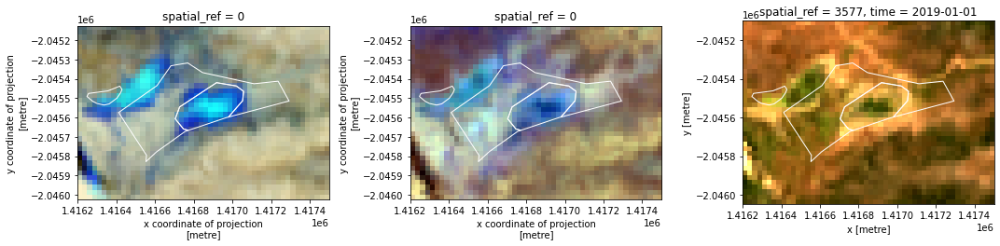

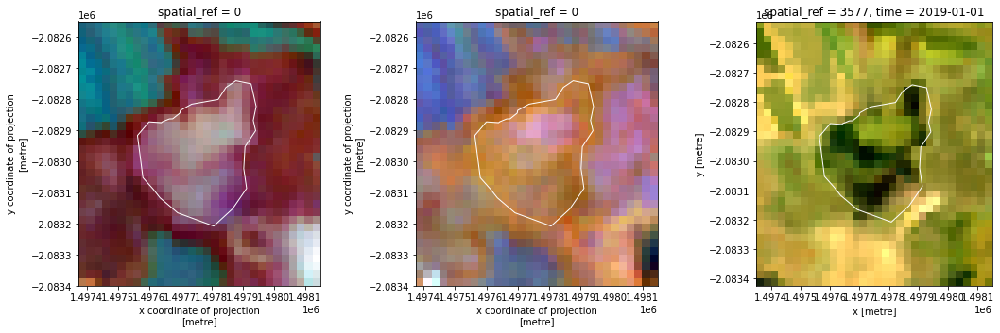

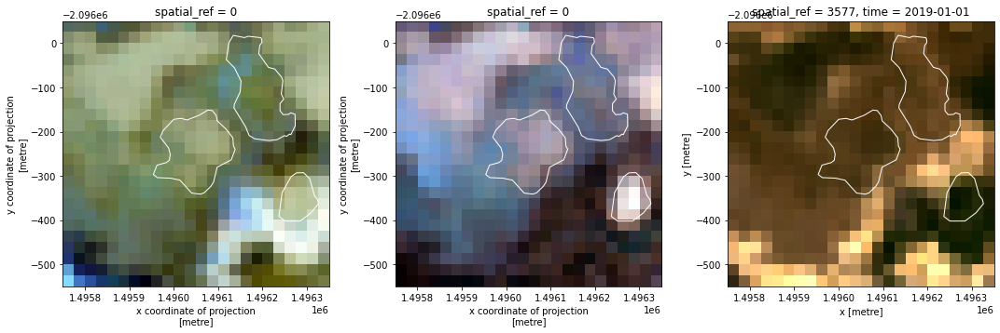

In [24]:
for i in np.arange(0, 30, 10):
    w = focus_wetlands[focus_wetlands.label == '14,-21'].iloc[i]
    plot_wetland(w)

#### Getting the wetland raster data

Let's grab the TCW, TCG, LS8, FC, and MrVBF for these areas and compare them to the non-wetland areas.

In [25]:
geom_in = focus_wetlands.geometry.unary_union

In [26]:
geom_out = geom_in.buffer(2000).difference(wetlands[tile_mask & ~small].geometry.unary_union)

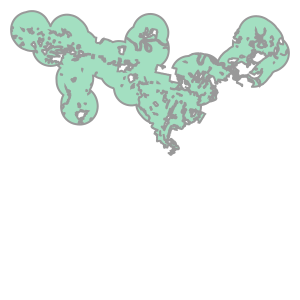

In [27]:
geom_out.geoms[0]

In [28]:
label = '14,-21'
tcw_in = tcws[label].rio.clip(geom_in)
tcw_out = tcws[label].rio.clip(geom_out)
tcg_in = tcgs[label].rio.clip(geom_in)
tcg_out = tcgs[label].rio.clip(geom_out)
vbf_in = vbfs[label].rio.clip(geom_in)
vbf_out = vbfs[label].rio.clip(geom_out)

In [29]:
ls8 = dc.load('ls8_nbart_geomedian_annual', time='2019-01',
              geopolygon=datacube.utils.geometry.Geometry(tiles[tiles.label == focus_wetlands.iloc[0].label].geometry.iloc[0], crs='EPSG:3577')).isel(time=0)

ls8_in = ls8.rio.clip(geom_in)
ls8_out = ls8.rio.clip(geom_out)

In [30]:
lsbe = dc.load('landsat_barest_earth',
              geopolygon=datacube.utils.geometry.Geometry(tiles[tiles.label == focus_wetlands.iloc[0].label].geometry.iloc[0], crs='EPSG:3577'))

lsbe_in = lsbe.rio.clip(geom_in)
lsbe_out = lsbe.rio.clip(geom_out)

In [31]:
lsbe

<xarray.Dataset>
Dimensions:      (time: 1, x: 4000, y: 4000)
Coordinates:
  * time         (time) datetime64[ns] 1999-01-01
  * y            (y) float64 -2e+06 -2e+06 -2e+06 ... -2.1e+06 -2.1e+06 -2.1e+06
  * x            (x) float64 1.4e+06 1.4e+06 1.4e+06 ... 1.5e+06 1.5e+06 1.5e+06
    spatial_ref  int32 3577
Data variables:
    blue         (time, y, x) int16 432 415 411 462 447 ... 580 576 576 571 574
    green        (time, y, x) int16 652 631 628 724 705 ... 594 591 587 583 590
    red          (time, y, x) int16 820 789 785 921 894 ... 331 326 322 318 325
    nir          (time, y, x) int16 2099 2068 2093 2203 2209 ... 245 247 241 246
    swir1        (time, y, x) int16 2871 2777 2749 3118 2979 ... 158 159 154 155
    swir2        (time, y, x) int16 1836 1728 1691 2036 1934 ... 126 127 122 124
Attributes:
    crs:           EPSG:3577
    grid_mapping:  spatial_ref

In [32]:
fc = dc.load('ls8_fc_albers', time='2019-01',
             geopolygon=datacube.utils.geometry.Geometry(tiles[tiles.label == focus_wetlands.iloc[0].label].geometry.iloc[0], crs='EPSG:3577')).isel(time=0)

In [33]:
fc_in = fc.rio.clip(geom_in)
fc_out = fc.rio.clip(geom_out)

In [34]:
fcp = dc.load('fc_percentile_albers_annual', time='2019-01',
             geopolygon=datacube.utils.geometry.Geometry(tiles[tiles.label == focus_wetlands.iloc[0].label].geometry.iloc[0], crs='EPSG:3577')).isel(time=0)

In [35]:
fcp_in = fcp.rio.clip(geom_in)
fcp_out = fcp.rio.clip(geom_out)

In [36]:
wofs = dc.load('wofs_annual_summary', time='2018-01',
             geopolygon=datacube.utils.geometry.Geometry(tiles[tiles.label == focus_wetlands.iloc[0].label].geometry.iloc[0], crs='EPSG:3577')).isel(time=0)

In [37]:
wofs_in = wofs.rio.clip(geom_in)
wofs_out = wofs.rio.clip(geom_out)

#### Visualising the space

We can turn these into features and try to visualise the feature space.

In [38]:
null_mask = tcw_in.values[0] <= -9999
features_in = np.concatenate([
    tcw_in.values[:, ~null_mask],
    tcg_in.values[:, ~null_mask],
    vbf_in.values[:, ~null_mask],
    fc_in.to_array().values[:, ~null_mask],
    fcp_in.to_array().values[:, ~null_mask],
    ls8_in.to_array().values[:, ~null_mask],
    wofs_in.to_array().values[:, ~null_mask],
], axis=0).T

In [39]:
wofs

<xarray.Dataset>
Dimensions:      (x: 4000, y: 4000)
Coordinates:
    time         datetime64[ns] 2018-01-01
  * y            (y) float64 -2e+06 -2e+06 -2e+06 ... -2.1e+06 -2.1e+06 -2.1e+06
  * x            (x) float64 1.4e+06 1.4e+06 1.4e+06 ... 1.5e+06 1.5e+06 1.5e+06
    spatial_ref  int32 3577
Data variables:
    count_wet    (y, x) int16 0 0 0 0 0 0 0 0 0 0 ... 26 26 26 25 25 25 25 25 26
    count_clear  (y, x) int16 19 19 19 20 20 20 20 20 ... 26 25 25 25 25 25 26
    frequency    (y, x) float32 0.0 0.0 0.0 0.0 0.0 0.0 ... 1.0 1.0 1.0 1.0 1.0
Attributes:
    crs:           EPSG:3577
    grid_mapping:  spatial_ref

In [40]:
feature_names = (
    [f'TCW {k}' for k in [10, 50, 90, 95]] +
    [f'TCG {k}' for k in [10, 50, 90, 95]] +
    ['MrVBF'] +
    ['BS', 'PV', 'NPV', 'UE'] +
    ['BS 10', 'PV 10', 'NPV 10'] +
    ['BS 50', 'PV 50', 'NPV 50'] +
    ['BS 90', 'PV 90', 'NPV 90'] +
    ['blue', 'green', 'red', 'nir', 'swir1', 'swir2'] +
    ['wofs wet', 'wofs clear', 'wofs freq'])

In [41]:
null_mask = tcw_out.values[0] <= -9999
features_out = np.concatenate([
    tcw_out.values[:, ~null_mask],
    tcg_out.values[:, ~null_mask],
    vbf_out.values[:, ~null_mask],
    fc_out.to_array().values[:, ~null_mask],
    fcp_out.to_array().values[:, ~null_mask],
    ls8_out.to_array().values[:, ~null_mask],
    wofs_out.to_array().values[:, ~null_mask],
], axis=0).T

In [42]:
features_in = np.nan_to_num(features_in, nan=-1)  # The NaNs are only in MrVBF, which has a minimum of 0.

In [43]:
features_out = np.nan_to_num(features_out, nan=-1)

In [44]:
features_all = np.concatenate([features_in, features_out])

The most obvious thing to do is PCA.

In [45]:
pca = sklearn.decomposition.PCA(n_components=10)

In [46]:
scaler = sklearn.preprocessing.StandardScaler()

In [47]:
pipeline = sklearn.pipeline.Pipeline([('scaler', scaler), ('pca', pca)])

In [48]:
pipeline.fit(features_all)

Pipeline(steps=[('scaler', StandardScaler()), ('pca', PCA(n_components=10))])

In [49]:
pca_f_in = pipeline.transform(features_in)

In [50]:
pca_f_out = pipeline.transform(features_out)

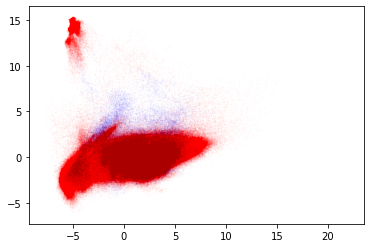

In [51]:
plt.scatter(*pca_f_in.T[:2], s=1, c='blue', alpha=0.01)
plt.scatter(*pca_f_out.T[:2], s=1, c='red', alpha=0.01)

Hard to see good class separation here.

#### Linear discriminant analysis

Using all of our data, let's try to fit a linear discriminator.

In [52]:
import sklearn.discriminant_analysis

In [53]:
lda = sklearn.discriminant_analysis.LinearDiscriminantAnalysis()

In [54]:
pipeline = sklearn.pipeline.Pipeline([('scaler', scaler), ('lda', lda)])

In [55]:
labels = np.zeros(len(features_all), dtype=bool)

In [56]:
labels[:len(features_in)] = True

In [57]:
pipeline.fit(features_all, labels)

Pipeline(steps=[('scaler', StandardScaler()),
                ('lda', LinearDiscriminantAnalysis())])

In [58]:
predictions = pipeline.predict(features_all)

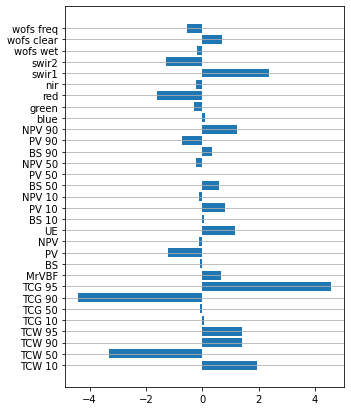

In [59]:
plt.figure(figsize=(5, 7))
plt.barh(range(lda.coef_.shape[1]), lda.coef_.ravel())
plt.yticks(range(lda.coef_.shape[1]), feature_names, rotation='horizontal')
plt.grid(axis='y', which='major')

In [60]:
df = pipeline.decision_function(features_all)

plt.hist(df[labels], density=True, bins=50, alpha=0.5);
plt.hist(df[~labels], density=True, bins=50, alpha=0.5);
thresh_99 = np.percentile(df[~labels], 90)
plt.axvline(thresh_99, c='grey')

We can draw a line at the 99th percentile of non-wetlands and call this a threshold. Let's apply this to a tile and visualise it.

In [119]:
features = np.concatenate([
    tcws[label].values,
    tcgs[label].values,
    vbfs[label].values,
    fc.to_array().values,
    fcp.to_array().values,
    ls8.to_array().values,
    wofs.to_array().values,
], axis=0)

In [63]:
df_tile = pipeline.decision_function(np.nan_to_num(features).reshape(features.shape[0], -1).T)

df_tile_xa = xarray.DataArray(df_tile.reshape(4000, 4000), coords=tcws[label].isel(band=0).coords)

(-2100000.0, -2060000.0)

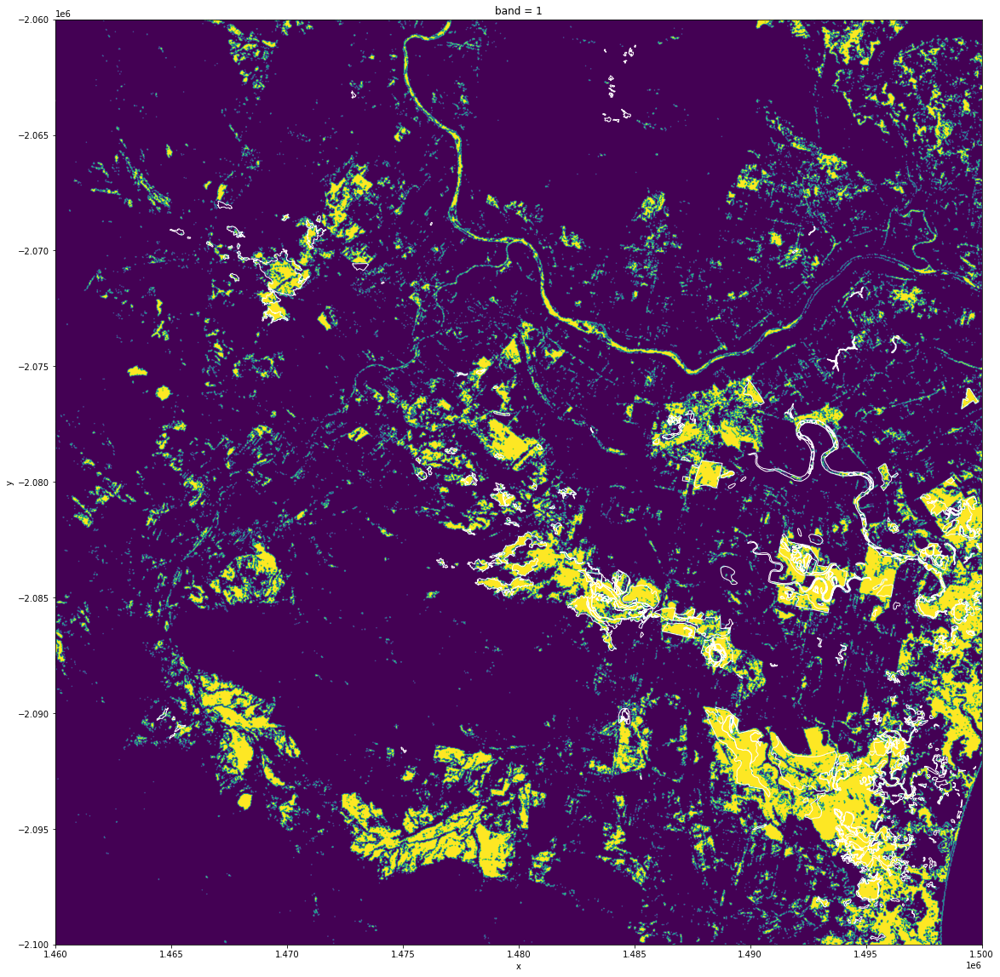

In [65]:
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(1, 1, 1)
(df_tile_xa > thresh_99).plot.imshow(interpolation='gaussian', add_colorbar=False, ax=ax)
focus_wetlands.plot(edgecolor='white', facecolor='None', ax=ax)
plt.xlim(1.46e6, None)
plt.ylim(None, -2.06e6)

In [79]:
blurry = xarray.DataArray(
    (scipy.ndimage.filters.gaussian_filter((df_tile_xa > thresh_99).astype(float), 10)),
    coords=df_tile_xa.coords)

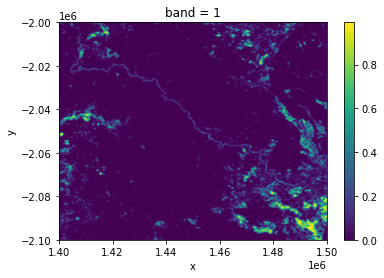

In [80]:
blurry.plot.imshow()

(-2099987.5, -2060000.0)

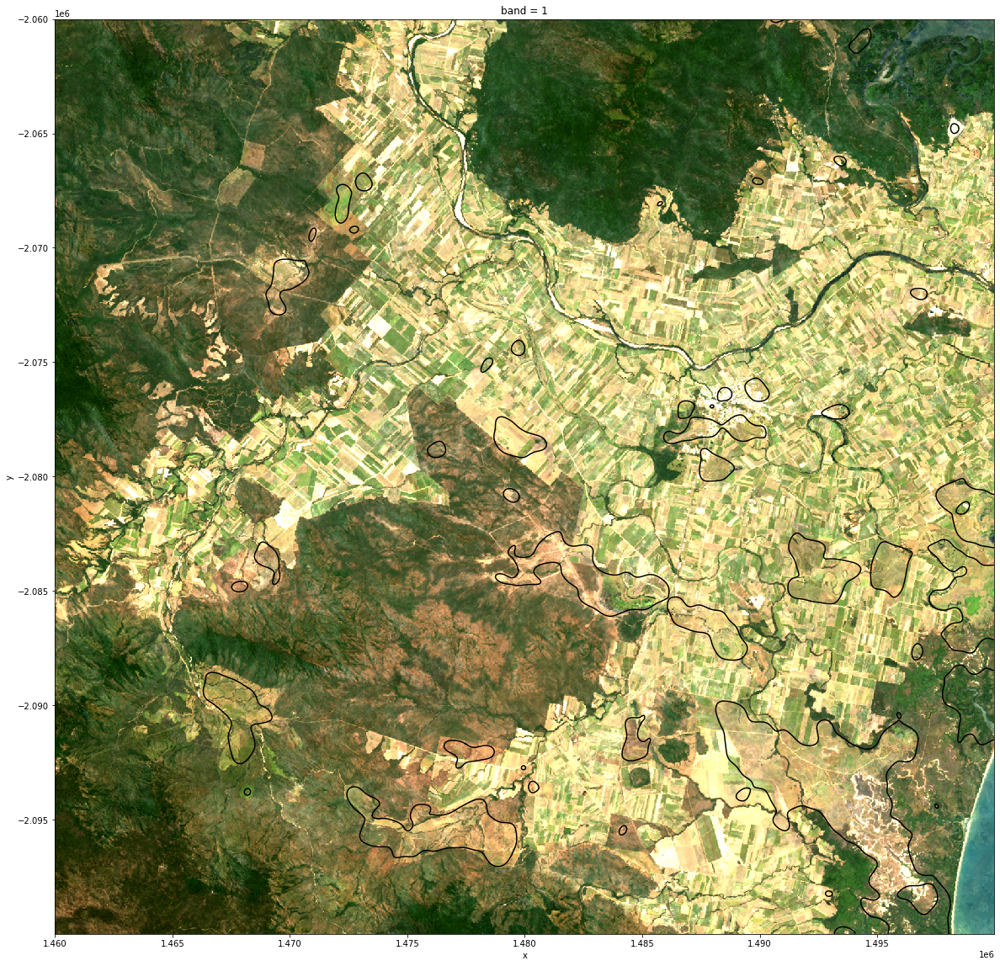

In [83]:
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(1, 1, 1)
rgb(ls8, bands=['red', 'green', 'blue'], ax=ax)
blurry.plot.contour(ax=ax, colors='black', levels=1)
plt.xlim(1.46e6, None)
plt.ylim(None, -2.06e6)

#### Refining features

To make this more interpretable, let's get rid of features that don't matter. Here's our feature importances:

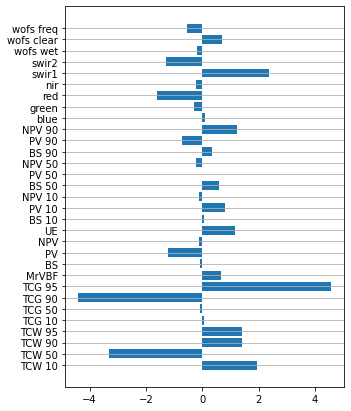

So...

In [149]:
to_keep_features = (
    [f'TCW {k}' for k in [10, 50, 90]] +
    [f'TCG {k}' for k in [90, 95]] +
    ['red', 'swir2'])

In [150]:
features_refined = np.array([features_all[:, feature_names.index(f)] for f in to_keep_features]).T

In [151]:
scaler2 = sklearn.preprocessing.StandardScaler()
lda2 = sklearn.discriminant_analysis.LinearDiscriminantAnalysis()
pipeline2 = sklearn.pipeline.Pipeline([('scaler', scaler2), ('lda', lda2)])
pipeline2.fit(features_refined, labels)

Pipeline(steps=[('scaler', StandardScaler()),
                ('lda', LinearDiscriminantAnalysis())])

In [152]:
predictions2 = pipeline2.predict(features_refined)

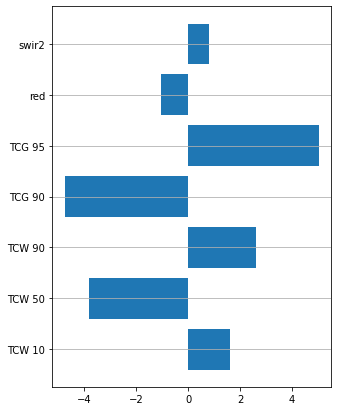

In [153]:
plt.figure(figsize=(5, 7))
plt.barh(range(lda2.coef_.shape[1]), lda2.coef_.ravel())
plt.yticks(range(lda2.coef_.shape[1]), to_keep_features, rotation='horizontal')
plt.grid(axis='y', which='major')

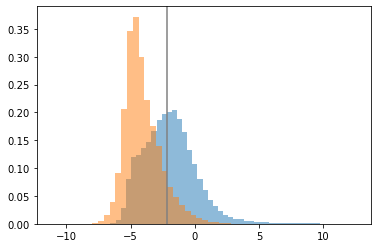

In [154]:
df2 = pipeline2.decision_function(features_refined)
plt.hist(df2[labels], density=True, bins=50, alpha=0.5);
plt.hist(df2[~labels], density=True, bins=50, alpha=0.5);
thresh_99_2 = np.percentile(df2[~labels], 90)
plt.axvline(thresh_99_2, c='grey')

In [155]:
features_refined_tile = np.array([features[feature_names.index(f)] for f in to_keep_features])

In [156]:
frt = np.nan_to_num(features_refined_tile).reshape(features_refined_tile.shape[0], -1).T

In [157]:
df2_tile = pipeline2.decision_function(frt)
df2_tile_xa = xarray.DataArray(df2_tile.reshape(4000, 4000), coords=tcws[label].isel(band=0).coords)

In [158]:
blurry = xarray.DataArray(
    (scipy.ndimage.filters.gaussian_filter((df2_tile_xa > thresh_99_2).astype(float), 10)),
    coords=df_tile_xa.coords)

(-2099987.5, -2060000.0)

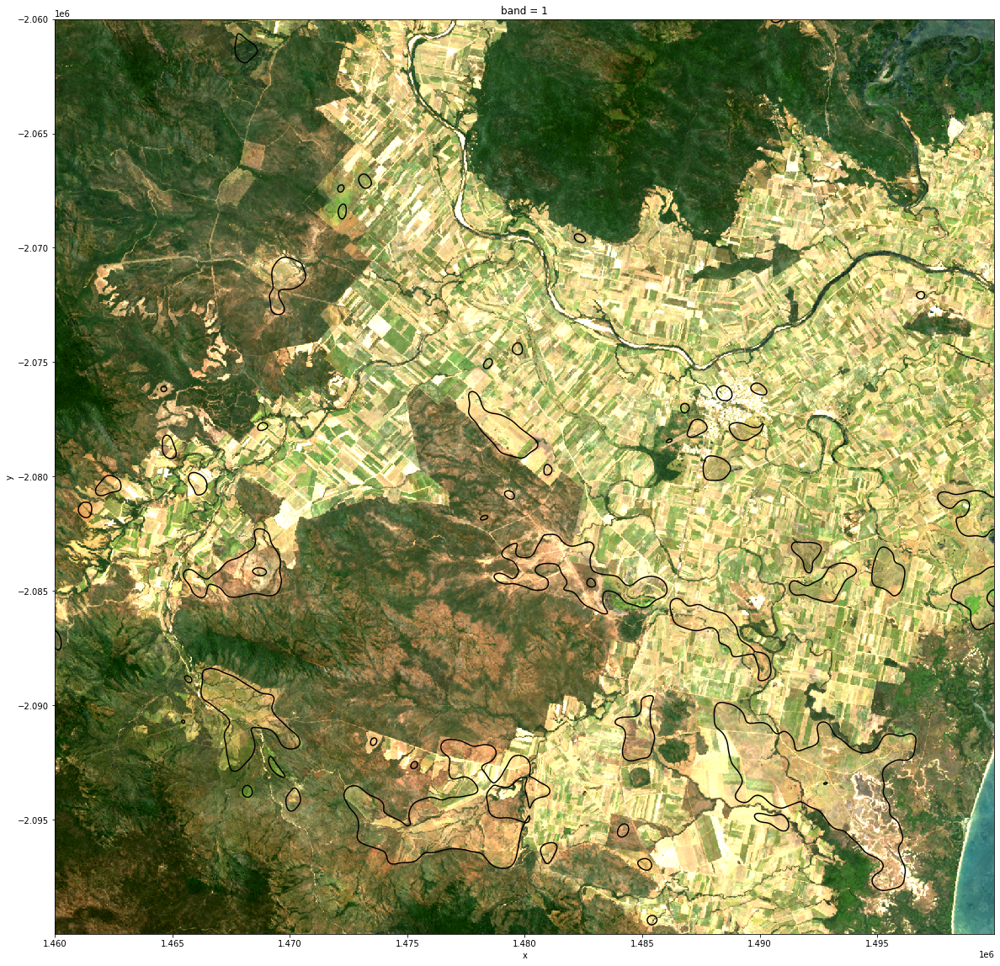

In [159]:
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(1, 1, 1)
rgb(ls8, bands=['red', 'green', 'blue'], ax=ax)
blurry.plot.contour(ax=ax, colors='black', levels=1)
plt.xlim(1.46e6, None)
plt.ylim(None, -2.06e6)